In [1]:
import pandas as pd
import os
import numpy as np

In [2]:
%matplotlib inline

In [3]:
import IPython
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error 
from matplotlib import pyplot as plt
import seaborn as sb
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings 
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=DeprecationWarning)
# pip install git+https://github.com/tensorflow/docs
import tensorflow as tf
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling
# Libraries and options
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Flatten

# 1. Data Preprocessing

## Load Data

In [4]:
from funda.load_data import DataLoader

data_loader = DataLoader(base_folder='/Users/Robinkratschmayr2/Library/Mobile Documents/com~apple~CloudDocs/2. Ausbildung/Master/Quarter 2/Artificial Intelligence for Business/Assignment/product3team2')
funda_2018 = data_loader.load_funda_data_2018()
funda_2018.head(5)

postcodes = data_loader.load_cbs_postcodes()

## Clean Data

In [5]:
from funda.clean_data import DataCleaner
data_cleaner = DataCleaner
funda_2018_cleaned = data_cleaner.clean_funda_2018(data=funda_2018)
#funda_2018 = funda_2018[['sellingPrice','Asking_Price_M2', 'yearofbuilding', 'numberrooms', 'numberbathrooms', 'energylabelclass','surface']]

Funda data 2018 cleaned


In [6]:
postcodes = postcodes.rename(columns={'PC6':'zipcode','Buurt2020':'NeighborhoodCode','Gemeente2020':'MunicipalityCode','Wijk2020':'DistrictCode'}).astype({'NeighborhoodCode':'object'}).drop_duplicates(subset='zipcode', keep="first")
postcodes['MunicipalityCode'] = postcodes['MunicipalityCode'].apply(lambda x: ("GM"+str(x)))
postcodes['DistrictCode'] = postcodes['DistrictCode'].apply(lambda x: ("WK"+str(x)))

In [7]:
postcodes.head()

,zipcode,NeighborhoodCode,DistrictCode,MunicipalityCode
0,1011AB,3630400,WK36304,GM363
1,1011AC,3630400,WK36304,GM363
2,1011AD,3630400,WK36304,GM363
3,1011AE,3630400,WK36304,GM363
4,1011AG,3630403,WK36304,GM363


In [8]:
funda_2018_cleaned_merged = funda_2018_cleaned.merge(postcodes, how="inner")

In [35]:
funda_2018_cleaned_features = funda_2018_cleaned_merged[['sellingPrice','categoryObject','yearOfBuilding','garden','parcelSurface','numberRooms','numberBathrooms','energylabelClass','surface','sellingTime','DistrictCode','MunicipalityCode']]
funda_2018_cleaned_features.head(5)
gt = funda_2018_cleaned_features

In [43]:
gt.describe()

,sellingPrice,yearOfBuilding,garden,parcelSurface,numberRooms,numberBathrooms,surface,sellingTime
count,2.052890e+05,205289.000000,205289.000000,142046.000000,205289.000000,205289.000000,205289.000000,205289.000000
mean,3.203838e+05,1972.549591,0.708168,545.584818,4.657225,0.793345,119.596729,60.638558
std,2.041587e+05,38.357972,0.454607,2509.486382,1.585636,0.582723,49.511561,70.285650
min,2.150000e+02,1005.000000,0.000000,10.000000,1.000000,0.000000,1.000000,-430.000000
25%,2.000000e+05,1956.000000,0.000000,143.000000,4.000000,0.000000,90.000000,18.000000
50%,2.700000e+05,1977.000000,1.000000,208.000000,5.000000,1.000000,114.000000,32.000000
75%,3.750000e+05,2000.000000,1.000000,346.000000,5.000000,1.000000,139.000000,76.000000
max,9.950000e+06,2988.000000,1.000000,297500.000000,41.000000,8.000000,3210.000000,618.000000


In [41]:
gt.shape

(205289, 12)

In [40]:
gt = gt[gt['sellingPrice']>0]

In [42]:
gt.head()

,sellingPrice,categoryObject,yearOfBuilding,garden,parcelSurface,numberRooms,numberBathrooms,energylabelClass,surface,sellingTime,DistrictCode,MunicipalityCode
0,139000.0,Woonhuis,1975,1,NaN,3,0.0,0,62,104,WK191105,GM1911
1,209000.0,Woonhuis,1980,1,148.0,5,1.0,B,136,-25,WK15800,GM158
2,267500.0,Appartement,2005,0,NaN,3,0.0,0,70,113,WK36381,GM363
3,549500.0,Woonhuis,2007,1,143.0,6,1.0,A,161,54,WK36381,GM363
4,287500.0,Appartement,2007,0,NaN,3,1.0,0,72,38,WK36381,GM363


In [44]:
# Exclude columns containing missing values
def get_cols_with_no_nans(df):
    cols_with_no_nans = []
    for col in df.columns:
        if not df[col].isnull().any():
            cols_with_no_nans.append(col)
    return cols_with_no_nans

cols_no_nans = get_cols_with_no_nans(gt)
gt = gt[cols_no_nans]
gt.describe()

,sellingPrice,yearOfBuilding,garden,numberRooms,numberBathrooms,surface,sellingTime
count,2.052890e+05,205289.000000,205289.000000,205289.000000,205289.000000,205289.000000,205289.000000
mean,3.203838e+05,1972.549591,0.708168,4.657225,0.793345,119.596729,60.638558
std,2.041587e+05,38.357972,0.454607,1.585636,0.582723,49.511561,70.285650
min,2.150000e+02,1005.000000,0.000000,1.000000,0.000000,1.000000,-430.000000
25%,2.000000e+05,1956.000000,0.000000,4.000000,0.000000,90.000000,18.000000
50%,2.700000e+05,1977.000000,1.000000,5.000000,1.000000,114.000000,32.000000
75%,3.750000e+05,2000.000000,1.000000,5.000000,1.000000,139.000000,76.000000
max,9.950000e+06,2988.000000,1.000000,41.000000,8.000000,3210.000000,618.000000


In [45]:
gt.describe()

,sellingPrice,yearOfBuilding,garden,numberRooms,numberBathrooms,surface,sellingTime
count,2.052890e+05,205289.000000,205289.000000,205289.000000,205289.000000,205289.000000,205289.000000
mean,3.203838e+05,1972.549591,0.708168,4.657225,0.793345,119.596729,60.638558
std,2.041587e+05,38.357972,0.454607,1.585636,0.582723,49.511561,70.285650
min,2.150000e+02,1005.000000,0.000000,1.000000,0.000000,1.000000,-430.000000
25%,2.000000e+05,1956.000000,0.000000,4.000000,0.000000,90.000000,18.000000
50%,2.700000e+05,1977.000000,1.000000,5.000000,1.000000,114.000000,32.000000
75%,3.750000e+05,2000.000000,1.000000,5.000000,1.000000,139.000000,76.000000
max,9.950000e+06,2988.000000,1.000000,41.000000,8.000000,3210.000000,618.000000


In [46]:
# Rename & extract the variable to predict
target = gt.sellingPrice
gt.drop(['sellingPrice'],axis = 1 , inplace = True)
gt.drop(['sellingTime'],axis = 1 , inplace = True)
gt['Target'] = target

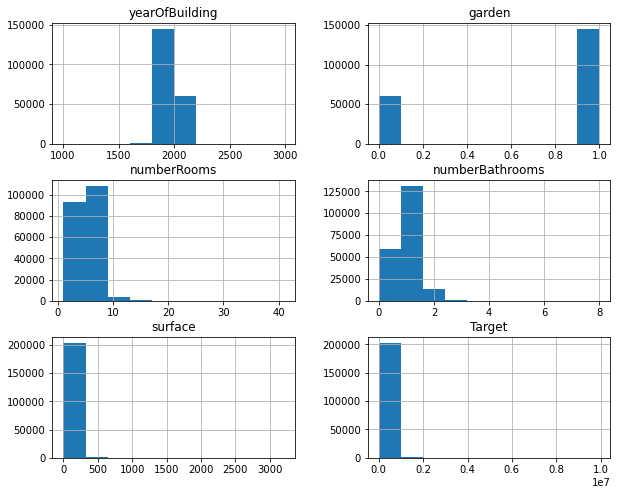

In [47]:
# Overview of feature distribution
gt.hist(figsize = (10,8))
plt.show()

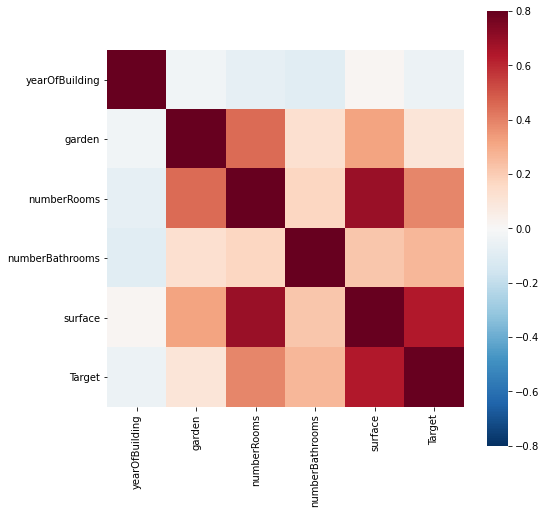

In [17]:
# Compute correlation
correlation_matrix = gt.corr()

# Open figure container
fig = plt.figure(figsize = (8,8))
# Make color heatmap (library seaborn)
sb.heatmap(correlation_matrix, vmax = 0.8, vmin=-0.8, square = True, cmap='RdBu_r')
# Display plot
plt.show()

In [18]:
gt.dtypes

categoryObject       object
yearOfBuilding        int64
garden                int64
numberRooms           int64
numberBathrooms     float64
energylabelClass     object
surface               int64
DistrictCode         object
MunicipalityCode     object
Target              float64
dtype: object

## Dummy Coding Categorical Variables

In [48]:
# Function for the one-hot encoding
def oneHotEncode(df,colNames):
    for col in colNames:
        if( df[col].dtype == np.dtype('object')):
            dummies = pd.get_dummies(df[col],prefix=col)
            df = pd.concat([df,dummies],axis=1)

            #drop the encoded column
            df.drop([col],axis = 1 , inplace=True)
    return df

# Get index of categorical columns 
cat_cols = gt.select_dtypes(include=['object'])
cat_cols = cat_cols.columns

# Transform data
print('There were {} columns before encoding categorical features'.format(gt.shape[1]))
gt = oneHotEncode(gt, cat_cols)
print('There are {} columns after encoding categorical features'.format(gt.shape[1]))

There were 10 columns before encoding categorical features
There are 3365 columns after encoding categorical features


In [20]:
gt.head()

,yearOfBuilding,garden,numberRooms,numberBathrooms,surface,Target,categoryObject_Appartement,categoryObject_Woonhuis,energylabelClass_0,energylabelClass_A,...,MunicipalityCode_GM965,MunicipalityCode_GM971,MunicipalityCode_GM98,MunicipalityCode_GM981,MunicipalityCode_GM983,MunicipalityCode_GM984,MunicipalityCode_GM986,MunicipalityCode_GM988,MunicipalityCode_GM994,MunicipalityCode_GM995
0,1975,1,3,0.0,62,139000.0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,1980,1,5,1.0,136,209000.0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2005,0,3,0.0,70,267500.0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,2007,1,6,1.0,161,549500.0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,2007,0,3,1.0,72,287500.0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


## split data into training and test set

In [49]:
n_train = round(gt.shape[0] * 0.6)
train = gt[:n_train]
test = gt[n_train:]

target = train['Target']
train.drop(['Target'], axis = 1, inplace = True)

truth = test['Target']
test.drop(['Target'], axis = 1, inplace = True)

In [59]:
train, test = train_test_split(gt, test_size=0.4)

target = train['Target']
train.drop(['Target'], axis = 1, inplace = True)

truth = test['Target']
test.drop(['Target'], axis = 1, inplace = True)

# Build neural Network

In [71]:
# Initiate a sequential model (i.e., no recurrence)
NN_model = Sequential()

# Make the first layer
NN_model.add(Dense(11, kernel_initializer='normal',input_dim = train.shape[1], activation='relu'))

# Make hidden layers
NN_model.add(Dense(2560, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(2560, kernel_initializer='normal',activation='relu'))
#NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

# Make the output layer
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network
NN_model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse','mae'])
NN_model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19 (Dense)             (None, 11)                37015     
_________________________________________________________________
dense_20 (Dense)             (None, 2560)              30720     
_________________________________________________________________
dense_21 (Dense)             (None, 2560)              6556160   
_________________________________________________________________
dense_22 (Dense)             (None, 1)                 2561      
Total params: 6,626,456
Trainable params: 6,626,456
Non-trainable params: 0
_________________________________________________________________


## checkpoint system

In [73]:
# Define how to name the files
checkpoint_name = 'Weights-{epoch:03d}--{val_loss:.5f}.hdf5' 
# Instantiate the checkpoint system
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

## train model

In [74]:
history = NN_model.fit(train, target, epochs=100, 
             # No. of randomly sampled data points used to compute the errors at each epoch (avoid overfitting)
             batch_size=150, 
             # Size of validation set for cross-validation
             validation_split = 0.2, 
             # Link to checkpoint system, to check teh best model previously built
             callbacks=callbacks_list)

poch 00028: val_loss did not improve from 10147133440.00000
Epoch 29/100
657/657 [==============================] - 27s 41ms/step - loss: 9093113761.0699 - mse: 9093113896.4620 - mae: 58051.0811 - val_loss: 11313613824.0000 - val_mse: 11313613824.0000 - val_mae: 55106.9062

Epoch 00029: val_loss did not improve from 10147133440.00000
Epoch 30/100
657/657 [==============================] - 27s 42ms/step - loss: 8589101974.9544 - mse: 8589101966.3951 - mae: 56231.9122 - val_loss: 11252610048.0000 - val_mse: 11252610048.0000 - val_mae: 58751.9219

Epoch 00030: val_loss did not improve from 10147133440.00000
Epoch 31/100
657/657 [==============================] - 27s 41ms/step - loss: 8789819340.2553 - mse: 8789819394.7234 - mae: 57409.5909 - val_loss: 11695447040.0000 - val_mse: 11695447040.0000 - val_mae: 58078.4414

Epoch 00031: val_loss did not improve from 10147133440.00000
Epoch 32/100
657/657 [==============================] - 28s 43ms/step - loss: 8951055963.0395 - mse: 8951055956.

### vorheriger Best val_loss 9.225631e+09

## Inspect errors, epoch after epoch

In [75]:
# Retrieve the hitory of every epoch's training
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail(25)

,loss,mse,mae,val_loss,val_mse,val_mae,epoch
75,7.914478e+09,7.914478e+09,54819.261719,1.118643e+10,1.118643e+10,55391.265625,75
76,8.114309e+09,8.114309e+09,55386.585938,1.120468e+10,1.120468e+10,54858.808594,76
77,7.757580e+09,7.757580e+09,54331.597656,1.095516e+10,1.095516e+10,54307.035156,77
78,7.688310e+09,7.688310e+09,54107.218750,1.455845e+10,1.455845e+10,69760.218750,78
79,7.645629e+09,7.645629e+09,53842.152344,1.094305e+10,1.094305e+10,54494.195312,79
80,7.768678e+09,7.768678e+09,54451.511719,1.099375e+10,1.099375e+10,55298.441406,80
81,8.001647e+09,8.001647e+09,55260.460938,1.144461e+10,1.144461e+10,55986.015625,81
82,7.783675e+09,7.783675e+09,54687.812500,1.142963e+10,1.142963e+10,55130.167969,82
83,7.748817e+09,7.748817e+09,54083.816406,1.152315e+10,1.152315e+10,57441.101562,83
84,7.673975e+09,7.673975e+09,54106.101562,1.132840e+10,1.132840e+10,54101.878906,84


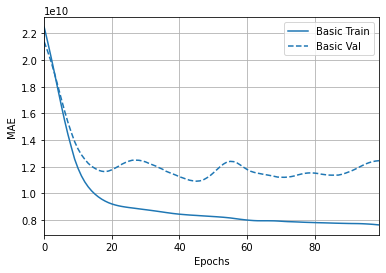

In [77]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)
plotter.plot({'Basic': history}, metric = "mse")
plt.ylabel('MAE')
plt.show()

# Test the Neural Network

In [78]:
#!# Check best checkpoint in your local folder (the last file saved)
#   Paste the name of the last file saved by tech checkpoint system
weights_file = 'Weights-033--10043379712.00000.hdf5' 

# Load teh parameters of teh models (weights & bias)
NN_model.load_weights(weights_file)
NN_model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])
#model.compile(loss='mse',optimizer='sgd',metrics=['accuracy'])

In [79]:
prediction = NN_model.predict(test)

In [80]:
prediction

array([[477063.38],
       [254357.62],
       [803595.6 ],
       ...,
       [276239.7 ],
       [232606.98],
       [447697.66]], dtype=float32)

In [73]:
truth

123613    449500.0
123614    299000.0
123615    695000.0
123616    265000.0
123617    289000.0
            ...   
206016    439000.0
206017    225000.0
206018    159000.0
206019    391500.0
206020    375000.0
Name: Target, Length: 82408, dtype: float64

In [69]:
acc = []
for i in range(0,len(prediction)):
    accuracy = prediction[i][0]/truth_array[i]
    if accuracy > 1:
        accuracy =

0
1
2
3
4


In [45]:
accuracy = prediction / truth.to_numpy()

In [47]:
accuracy[0]

array([0.9507532 , 1.42930957, 0.6149116 , ..., 2.68782115, 1.09160552,
       1.13963617])

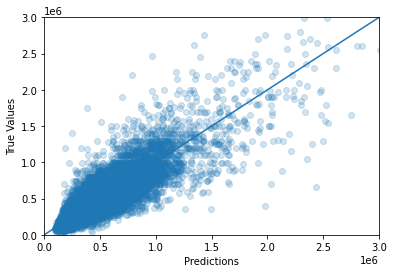

In [80]:
plt.figure()
plt.scatter(prediction, truth, alpha=0.2)
plt.xlabel('Predictions')
plt.ylabel('True Values')
lims = [0, 3000000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.show()

In [57]:
error = prediction - truth.to_numpy()
plt.figure()
plt.hist(error[0], bins = 30)
plt.xlabel("Prediction Error")
plt.ylabel("Count")
plt.show()

# Questions

1. why do we use the absolute loss and not the average los?
2. what helps us in the decision making of how many layers etc we are going to use?